In [2]:
# !pip install openai

In [18]:
from openai import OpenAI
import torch
from uform.gen_model import VLMForCausalLM, VLMProcessor
from PIL import Image
import PIL
from concurrent.futures import ThreadPoolExecutor
from functools import partial
import io
import urllib
from datasets import load_dataset
from datasets.utils.file_utils import get_datasets_user_agent
import clip
import os
import json
import numpy as np
import base64
import requests

# Load Data

In [15]:
# load image captions from training data

# Path to .jsonl file
file_path = '/Users/seanhuang/MBAn/Sem2/HODL/Project/archive (1)/childrens-books/metadata.jsonl'

data = {}

# Open the .jsonl file
with open(file_path, 'r', encoding='utf-8') as file:
    # Read and parse each line
    for line in file:
        # Append each JSON object to the list
        img_and_cap = json.loads(line)
        img = img_and_cap['file_name']
        cap = img_and_cap['text']
        data[img] = {"caption": cap}

# Now, 'data' contains all the JSON objects from the .jsonl file
print(f"Loaded {len(data)} records.")

Loaded 1710 records.


In [19]:
# load images
image_folder_path = '/Users/seanhuang/MBAn/Sem2/HODL/Project/archive (1)/childrens-books'

# Loop through all files in the directory
for filename in os.listdir(image_folder_path):
    # Construct the full file path
    file_path = os.path.join(image_folder_path, filename)
    
    if file_path.lower().endswith(('.png', '.jpg', '.jpeg')):
        data[filename]['image'] = file_path

In [20]:
data

{'0001956604.jpg': {'caption': 'drawing in black and white of Egypt pyramids with the caption "PYRAMID"',
  'image': '/Users/seanhuang/MBAn/Sem2/HODL/Project/archive (1)/childrens-books/0001956604.jpg'},
 '0027352358.jpg': {'caption': 'drawing of a man with a telescope looking at stars with the title "GALILEO"',
  'image': '/Users/seanhuang/MBAn/Sem2/HODL/Project/archive (1)/childrens-books/0027352358.jpg'},
 '0030367697.jpg': {'caption': 'picture of a black and white owl with yellow eyes and title "MODERN BIOLOGY"',
  'image': '/Users/seanhuang/MBAn/Sem2/HODL/Project/archive (1)/childrens-books/0030367697.jpg'},
 '0030367778.jpg': {'caption': 'image of blue background with the title "MODERN CHEMISTRY"',
  'image': '/Users/seanhuang/MBAn/Sem2/HODL/Project/archive (1)/childrens-books/0030367778.jpg'},
 '0030367867.jpg': {'caption': 'image of blue chemical elements with the title "MODERN CHEMISTRY"',
  'image': '/Users/seanhuang/MBAn/Sem2/HODL/Project/archive (1)/childrens-books/00303678

# GPT 3.5-turbo

In [21]:
prompt = "Summarize the content of the image."

In [53]:
# gpt api_key and client initialization
key = ''

client = OpenAI(
    api_key=key
)

In [22]:
# Function to encode the image in base64
def encode_image(image_path):
  with open(image_path, "rb") as image_file:
    return base64.b64encode(image_file.read()).decode('utf-8')

In [23]:
# save encodings in dictionary
for key in data.keys():
    img_path = data[key]['image']
    b64 = encode_image(img_path)
    data[key]['b64'] = b64

In [24]:
data

{'0001956604.jpg': {'caption': 'drawing in black and white of Egypt pyramids with the caption "PYRAMID"',
  'image': '/Users/seanhuang/MBAn/Sem2/HODL/Project/archive (1)/childrens-books/0001956604.jpg',
  'b64': '/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCADgAOADASIAAhEBAxEB/8QAHwAAAQUBAQEBAQEAAAAAAAAAAAECAwQFBgcICQoL/8QAtRAAAgEDAwIEAwUFBAQAAAF9AQIDAAQRBRIhMUEGE1FhByJxFDKBkaEII0KxwRVS0fAkM2JyggkKFhcYGRolJicoKSo0NTY3ODk6Q0RFRkdISUpTVFVWV1hZWmNkZWZnaGlqc3R1dnd4eXqDhIWGh4iJipKTlJWWl5iZmqKjpKWmp6ipqrKztLW2t7i5usLDxMXGx8jJytLT1NXW19jZ2uHi4+Tl5ufo6erx8vP09fb3+Pn6/8QAHwEAAwEBAQEBAQEBAQAAAAAAAAECAwQFBgcICQoL/8QAtREAAgECBAQDBAcFBAQAAQJ3AAECAxEEBSExBhJBUQdhcRMiMoEIFEKRobHBCSMzUvAVYnLRChYkNOEl8RcYGRomJygpKjU2Nzg5OkNERUZHSElKU1RVVldYWVpjZGVmZ2hpanN0dXZ3eHl6goOEhYaHiImKkpOUlZaXmJmaoqOkpaanqKmqsrO0tba3uLm6wsPExcbHyMnK0tPU1dbX2Nn

In [54]:
def pred(b64):

  response = client.chat.completions.create(
  model="gpt-4-vision-preview",
  messages=[
    {
      "role": "user",
      "content": [
        {
          "type": "text",
          "text": "Summarize the content of the image for a child",
        },
        {
          "type": "image_url",
          "image_url": {
            "url": f"data:image/jpeg;base64,{b64}"
          }
        },
      ],
    }
  ],
  max_tokens=300,
  )
  
  return response.choices[0].message.content

In [55]:
texts = {}
count = 1

for file_name, d in data.items():

    print(file_name, count)
    decoded_text = pred(data[file_name]['b64'])
    texts[file_name] = decoded_text

    count += 1

0001956604.jpg 1
0027352358.jpg 2
0030367697.jpg 3
0030367778.jpg 4
0030367867.jpg 5
0030683726.jpg 6
0030683734.jpg 7
006009110X.jpg 8
0060099208.jpg 9
0060256710.jpg 10
0060271396.jpg 11
0060279028.jpg 12
0060280751.jpg 13
0060283246.jpg 14
0060284870.jpg 15
0060287934.jpg 16
0060291907.jpg 17
0060526335.jpg 18
0060560452.jpg 19
0060560665.jpg 20
0060565098.jpg 21
0060576154.jpg 22
0060589450.jpg 23
0060591374.jpg 24
0060728396.jpg 25
0060732113.jpg 26
0060759046.jpg 27
0060760907.jpg 28
0060782188.jpg 29
0060815566.jpg 30
006085281X.jpg 31
0060877138.jpg 32
0060877197.jpg 33
0060928689.jpg 34
0061123250.jpg 35
0061131679.jpg 36
0061215341.jpg 37
006122779X.jpg 38
0061234796.jpg 39
0061235989.jpg 40
0061240354.jpg 41
0061255122.jpg 42
0061547948.jpg 43
0061688665.jpg 44
0061704040.jpg 45
0061756903.jpg 46
0061804428.jpg 47
0061935069.jpg 48
0061963739.jpg 49
0061996572.jpg 50
0062012932.jpg 51
0062020552.jpg 52
0062086707.jpg 53
0062104950.jpg 54
0062110586.jpg 55
0062110667.jpg 56
0

RateLimitError: Error code: 429 - {'error': {'message': 'Rate limit reached for gpt-4-vision-preview in organization org-PVLrT8nbf6L3Abvkds0lI2PX on requests per day (RPD): Limit 500, Used 500, Requested 1. Please try again in 2m52.8s. Visit https://platform.openai.com/account/rate-limits to learn more.', 'type': 'requests', 'param': None, 'code': 'rate_limit_exceeded'}}

In [56]:
texts

{'0001956604.jpg': 'This is a picture of a book cover! The book is called "Pyramid," and the picture shows a big triangle-shaped structure, which is what pyramids look like. There are some clouds in the sky and it looks like there are little people and animals near the bottom of the pyramid, probably showing how the pyramids might have been built a long time ago.',
 '0027352358.jpg': 'The image shows a person looking up at the stars in the night sky through a long telescope. The background is dark with lots of little white dots that look like stars. Above the person, there\'s a big word "GALILEO" in gold letters, which is the name of a very famous person who studied the stars a long time ago. It looks like the cover of a book that tells the story of Galileo.',
 '0030367697.jpg': 'This image shows the cover of a book. The book is called "Modern Biology." There\'s a big picture of an owl with large orange eyes on the cover. Owls are birds that you might see out at night. They are known t

In [57]:
# write generated text to jsonl
file_path = '/Users/seanhuang/MBAn/Sem2/HODL/Project/gpt4_outputs.jsonl'

with open(file_path, 'w', encoding='utf-8') as file:
    for entry in texts:
        # Convert the dictionary to a JSON string and write it to the file
        file.write(json.dumps(entry) + ', ' +  json.dumps(texts[entry]) + '\n')

In [59]:
# evaluate generated captions using BERT embeddings and average of the cosine similarity matrix
from transformers import BertTokenizer, BertModel
import torch
from sklearn.metrics.pairwise import cosine_similarity

tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
model = BertModel.from_pretrained('bert-base-uncased')

score = {}

def encode(text):
    inputs = tokenizer(text, return_tensors="pt", padding=True, truncation=True, max_length=512)
    with torch.no_grad():
        outputs = model(**inputs)
    embeddings = outputs.last_hidden_state.mean(1)
    return embeddings

for filename in texts:
    captions = [data[filename]['caption'], texts[filename]]
    
    embeddings = torch.cat([encode(caption) for caption in captions], dim=0)
    similarity_matrix = cosine_similarity(embeddings)

    # calculate average similarity
    np.fill_diagonal(similarity_matrix, 0) # get rid of self-similarity
    avg_sim = np.sum(similarity_matrix) / (similarity_matrix.size - len(similarity_matrix))
    
    score[filename] = avg_sim

In [60]:
score

{'0001956604.jpg': 0.7366639971733093,
 '0027352358.jpg': 0.8345198631286621,
 '0030367697.jpg': 0.814464807510376,
 '0030367778.jpg': 0.6998451948165894,
 '0030367867.jpg': 0.7827198505401611,
 '0030683726.jpg': 0.7357608079910278,
 '0030683734.jpg': 0.8344502449035645,
 '006009110X.jpg': 0.8250651955604553,
 '0060099208.jpg': 0.8705084323883057,
 '0060256710.jpg': 0.8156024813652039,
 '0060271396.jpg': 0.8325754404067993,
 '0060279028.jpg': 0.7971848845481873,
 '0060280751.jpg': 0.8295960426330566,
 '0060283246.jpg': 0.8732214570045471,
 '0060284870.jpg': 0.8585700988769531,
 '0060287934.jpg': 0.7959731221199036,
 '0060291907.jpg': 0.843665599822998,
 '0060526335.jpg': 0.7825680375099182,
 '0060560452.jpg': 0.8073288798332214,
 '0060560665.jpg': 0.8746374845504761,
 '0060565098.jpg': 0.8105154633522034,
 '0060576154.jpg': 0.8163611888885498,
 '0060589450.jpg': 0.834907054901123,
 '0060591374.jpg': 0.8271077275276184,
 '0060728396.jpg': 0.7658423185348511,
 '0060732113.jpg': 0.8041055

In [61]:
# min score of basline model
min(score.values())

0.47607895731925964

In [62]:
# max score of baseline model
max(score.values())

0.8960381746292114

In [63]:
# average score of baseline model
np.mean(list(score.values()))

0.8067459080900464

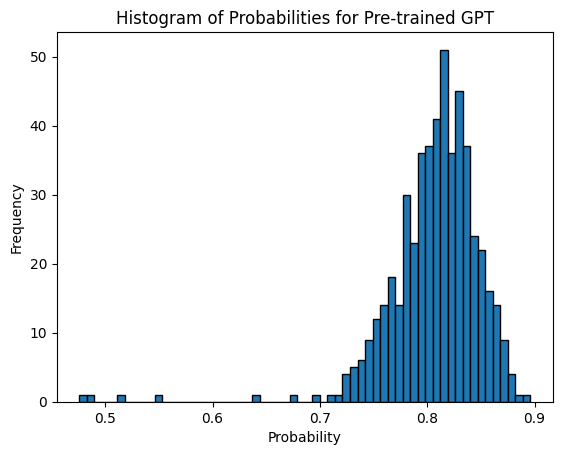

In [112]:
import matplotlib.pyplot as plt

# score distributions
probabilities = list(score.values())

# Plotting the histogram
plt.hist(probabilities, bins=60, edgecolor='black')  # Adjust 'bins' as needed

plt.title('Histogram of Probabilities for Pre-trained GPT')
plt.xlabel('Probability')
plt.ylabel('Frequency')

# Show the plot
plt.show()

# Fine-tuning

In [68]:
# upload file containing labels
client.files.create(
  file=open("/Users/seanhuang/MBAn/Sem2/HODL/Project/train.jsonl", "rb"),
  purpose="fine-tune"
)

FileObject(id='file-OLOMUMUGfrsI3l1crv534u5Q', bytes=7664, created_at=1709869859, filename='train.jsonl', object='file', purpose='fine-tune', status='processed', status_details=None)

In [70]:
# create fine-tuning job
client.fine_tuning.jobs.create(
  training_file="file-OLOMUMUGfrsI3l1crv534u5Q", 
  model="gpt-3.5-turbo"
)

FineTuningJob(id='ftjob-CTpoKdppqJB1DuGugRL5lOLC', created_at=1709869873, error=Error(code=None, message=None, param=None, error=None), fine_tuned_model=None, finished_at=None, hyperparameters=Hyperparameters(n_epochs='auto', batch_size='auto', learning_rate_multiplier='auto'), model='gpt-3.5-turbo-0125', object='fine_tuning.job', organization_id='org-PVLrT8nbf6L3Abvkds0lI2PX', result_files=[], status='validating_files', trained_tokens=None, training_file='file-OLOMUMUGfrsI3l1crv534u5Q', validation_file=None, user_provided_suffix=None)

In [78]:
# Retrieve the state of a fine-tune
client.fine_tuning.jobs.retrieve('ftjob-CTpoKdppqJB1DuGugRL5lOLC')

FineTuningJob(id='ftjob-CTpoKdppqJB1DuGugRL5lOLC', created_at=1709869873, error=Error(code=None, message=None, param=None, error=None), fine_tuned_model='ft:gpt-3.5-turbo-0125:personal::90Ler8CZ', finished_at=1709870281, hyperparameters=Hyperparameters(n_epochs=10, batch_size=1, learning_rate_multiplier=2), model='gpt-3.5-turbo-0125', object='fine_tuning.job', organization_id='org-PVLrT8nbf6L3Abvkds0lI2PX', result_files=['file-aae2RVX4Bm39iNzJiiBj1EHR'], status='succeeded', trained_tokens=15650, training_file='file-OLOMUMUGfrsI3l1crv534u5Q', validation_file=None, user_provided_suffix=None)

In [97]:
# use fine-tuned model
def transf(s1):
  completion = client.chat.completions.create(
    model='ft:gpt-3.5-turbo-0125:personal::90Ler8CZ',
    messages=[
      {"role": "system", "content": "I have some images of children's book covers. I use deep learning model to generate captions for those book covers. Now I am going to give you those captions and I want you to transform them into the style used in your fine-tuning."},
      {"role": "user", "content": s1}
    ]
  )
  return completion.choices[0].message.content

In [98]:
# generate new captions using fine-tuned gpt-3.5-turbo
new_captions = {}
count = 1
for file in texts:
    print(file, count)
    new_captions[file] = transf(texts[file])
    count += 1

0001956604.jpg 1
0027352358.jpg 2
0030367697.jpg 3
0030367778.jpg 4
0030367867.jpg 5
0030683726.jpg 6
0030683734.jpg 7
006009110X.jpg 8
0060099208.jpg 9
0060256710.jpg 10
0060271396.jpg 11
0060279028.jpg 12
0060280751.jpg 13
0060283246.jpg 14
0060284870.jpg 15
0060287934.jpg 16
0060291907.jpg 17
0060526335.jpg 18
0060560452.jpg 19
0060560665.jpg 20
0060565098.jpg 21
0060576154.jpg 22
0060589450.jpg 23
0060591374.jpg 24
0060728396.jpg 25
0060732113.jpg 26
0060759046.jpg 27
0060760907.jpg 28
0060782188.jpg 29
0060815566.jpg 30
006085281X.jpg 31
0060877138.jpg 32
0060877197.jpg 33
0060928689.jpg 34
0061123250.jpg 35
0061131679.jpg 36
0061215341.jpg 37
006122779X.jpg 38
0061234796.jpg 39
0061235989.jpg 40
0061240354.jpg 41
0061255122.jpg 42
0061547948.jpg 43
0061688665.jpg 44
0061704040.jpg 45
0061756903.jpg 46
0061804428.jpg 47
0061935069.jpg 48
0061963739.jpg 49
0061996572.jpg 50
0062012932.jpg 51
0062020552.jpg 52
0062086707.jpg 53
0062104950.jpg 54
0062110586.jpg 55
0062110667.jpg 56
0

In [99]:
new_captions

{'0001956604.jpg': 'In this ancient world of wonders, the monumental pyramid rises towards the heavens, casting its shadow over the land. Surrounded by bustling activity, tiny figures and creatures toil under the watchful gaze of the towering structure, a testament to the ingenuity and labor of ancient civilizations. The sky above is adorned with billowing clouds, adding to the mystique and grandeur of this timeless marvel.',
 '0027352358.jpg': 'Whispers of the Cosmos: The Stargazing Tales of Galileo',
 '0030367697.jpg': 'The image displays the book cover for "Modern Biology," featuring a prominent illustration of an owl with enormous orange eyes. Owls, commonly associated with wisdom, are nocturnal birds frequently connected to knowledge. Given the subject matter of biology, this book likely delves into the study of living organisms and their mechanisms.',
 '0030367778.jpg': '"The cover of this book, \'Modern Chemistry,\' features a vibrant blue background with white text and three pe

In [114]:
# write generated text to jsonl
file_path = '/Users/seanhuang/MBAn/Sem2/HODL/Project/fine_tuned_outputs.jsonl'

with open(file_path, 'w', encoding='utf-8') as file:
    for entry in new_captions:
        # Convert the dictionary to a JSON string and write it to the file
        file.write(json.dumps(entry) + ', ' +  json.dumps(new_captions[entry]) + '\n')

In [100]:
fine_score = {}
for filename in new_captions:
    captions = [data[filename]['caption'], new_captions[filename]]
    
    embeddings = torch.cat([encode(caption) for caption in captions], dim=0)
    similarity_matrix = cosine_similarity(embeddings)

    # calculate average similarity
    np.fill_diagonal(similarity_matrix, 0) # get rid of self-similarity
    avg_sim = np.sum(similarity_matrix) / (similarity_matrix.size - len(similarity_matrix))
    
    fine_score[filename] = avg_sim

In [101]:
fine_score

{'0001956604.jpg': 0.6114147901535034,
 '0027352358.jpg': 0.7109324932098389,
 '0030367697.jpg': 0.7969225645065308,
 '0030367778.jpg': 0.7216758728027344,
 '0030367867.jpg': 0.8023780584335327,
 '0030683726.jpg': 0.7605830430984497,
 '0030683734.jpg': 0.8275855779647827,
 '006009110X.jpg': 0.8343701362609863,
 '0060099208.jpg': 0.9152623414993286,
 '0060256710.jpg': 0.8007580637931824,
 '0060271396.jpg': 0.8330619931221008,
 '0060279028.jpg': 0.8585611581802368,
 '0060280751.jpg': 0.8315790295600891,
 '0060283246.jpg': 0.811619758605957,
 '0060284870.jpg': 0.8380951881408691,
 '0060287934.jpg': 0.814311146736145,
 '0060291907.jpg': 0.7615289092063904,
 '0060526335.jpg': 0.7214989066123962,
 '0060560452.jpg': 0.83380126953125,
 '0060560665.jpg': 0.8028815984725952,
 '0060565098.jpg': 0.795473575592041,
 '0060576154.jpg': 0.7937250733375549,
 '0060589450.jpg': 0.8273601531982422,
 '0060591374.jpg': 0.7682843208312988,
 '0060728396.jpg': 0.6586101651191711,
 '0060732113.jpg': 0.767619848

In [105]:
# min score of basline model
min(fine_score.values())

0.43051064014434814

In [103]:
# max score of baseline model
max(fine_score.values())

0.9433766603469849

In [104]:
# average score of baseline model
np.mean(list(fine_score.values()))

0.7987176433033004

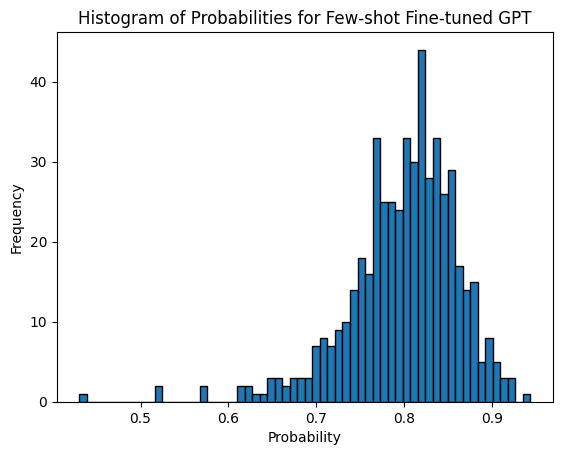

In [116]:
import matplotlib.pyplot as plt

# fine_score distributions
probabilities = list(fine_score.values())

# Plotting the histogram
plt.hist(probabilities, bins=60, edgecolor='black')  # Adjust 'bins' as needed

plt.title('Histogram of Probabilities for Few-shot Fine-tuned GPT')
plt.xlabel('Probability')
plt.ylabel('Frequency')

# Show the plot
plt.show()

In [117]:
max = 0
min = 0
max_file = ""
min_file = ""

for file in new_captions:
    dif = fine_score[file] - score[file]
    if dif > max:
        max = dif
        max_file = file
    elif dif < min:
        min = dif
        min_file = file

print("max:", max, "\nmin:", min, "\nmax file:", max_file, "\nmin_file:", min_file)

max: 0.18002331256866455 
min: -0.2606222629547119 
max file: 0064408884.jpg 
min_file: 0062020552.jpg


In [118]:
score["0027352358.jpg"]

0.8345198631286621

In [119]:
fine_score['0027352358.jpg']

0.7109324932098389